# Introduction to ITK Segmentation in SimpleITK Notebooks <a href="https://mybinder.org/v2/gh/InsightSoftwareConsortium/SimpleITK-Notebooks/master?filepath=Python%2F300_Segmentation_Overview.ipynb"><img style="float: right;" src="https://mybinder.org/badge_logo.svg"></a>

<b>Goal</b>: To become familiar with basic segmentation algorithms available in ITK, and interactively explore their parameter space.

Image segmentation filters process an image to partition it into (hopefully) meaningful regions. The output is commonly an image of integers where each integer can represent an object. The value 0 is commonly used for the background, and 1 ( sometimes 255) for a foreground object.


In [16]:
%matplotlib inline

#for fiji.
%env SITK_SHOW_COMMAND C:\Users\ekara\Downloads\fiji-win64\Fiji.app\ImageJ-win64.exe

import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider

import SimpleITK as sitk

# Download data to work on
from myshow import myshow, myshow3d
from ipywidgets import interact, IntSlider
import numpy as np
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib

env: SITK_SHOW_COMMAND=C:\Users\ekara\Downloads\fiji-win64\Fiji.app\ImageJ-win64.exe


In [2]:
import os
absolute_path = os.path.abspath(os.getcwd())
relative_path = "601.000000-COR 3X3-86740"
# Define the path to the DICOM series
full_path = os.path.join(absolute_path, relative_path)
print(full_path)

# Check path if it correct or not.

C:\Users\ekara\desktop\test\csc821_project\601.000000-COR 3X3-86740


In [3]:
import os

data_directory = full_path

# Check directory contents
contents = os.listdir(data_directory)
if not contents:
    print(f"ERROR: The directory {data_directory} is empty.")
    exit()

# Fetch the DICOM series IDs
series_IDs = sitk.ImageSeriesReader.GetGDCMSeriesIDs(data_directory)
if not series_IDs:
    print(f"ERROR: The directory {data_directory} does not contain a valid DICOM series.")
    exit()

# Use the first series ID to fetch file names of the DICOM series
dicom_series = sitk.ImageSeriesReader.GetGDCMSeriesFileNames(data_directory, series_IDs[0])

# Read the DICOM series into an image
reader = sitk.ImageSeriesReader()
reader.SetFileNames(dicom_series)
image = reader.Execute()

# Display the image (assuming you have myshow3d function defined)
myshow3d(image)


interactive(children=(IntSlider(value=52, description='z', max=105), Output()), _dom_classes=('widget-interact…

## Level-Set Segmentation

### Set seed location used in the image

In [ ]:
seed_topleft = (150, 150, 53)   # Coordinates for the seed in the left lung
seed_bottomleft = (150, 300, 53)  # Coordinates for the seed in the right lung
seed_topright = (380, 150, 53)   # Coordinates for the seed in the left lung
seed_bottomright = (380, 300, 53)  # Coordinates for the seed in the right lung

### Display Seed location

First we create a label image from our seed.

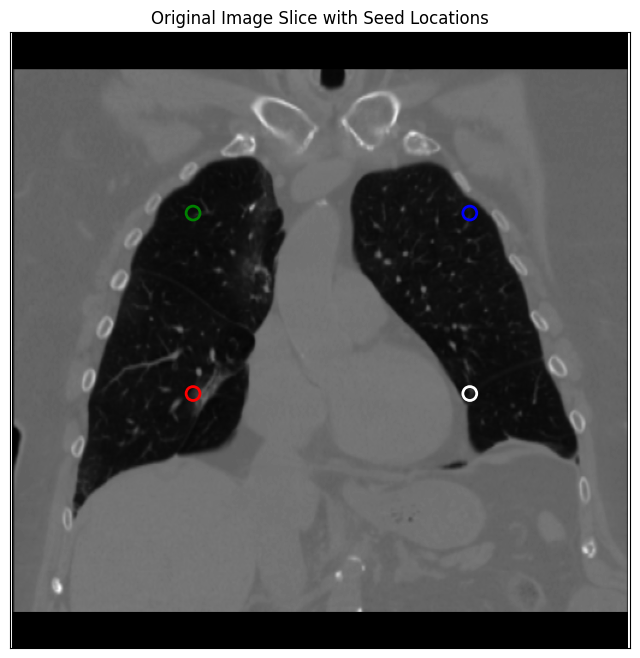

In [31]:
def display_slice_with_seeds(image, seed_topleft, seed_bottomleft,seed_topright, seed_bottomright,slice_number):
    # Extract the particular slice that contains the seeds
    image_slice = image[:,:,slice_number]
    
    # Convert to numpy array for display
    image_slice_np = sitk.GetArrayFromImage(image_slice)

    # Create a figure to display the results
    plt.figure(figsize=(8, 8))
    
    # Display the original slice
    plt.imshow(image_slice_np, cmap='gray')
    plt.title('Original Image Slice with Seed Locations')

    # Draw green circles at the seed locations
    plt.scatter([seed_topleft[0]], [seed_topleft[1]], s=100, facecolors='none', edgecolors='green', linewidths=2)
    plt.scatter([seed_bottomleft[0]], [seed_bottomleft[1]], s=100, facecolors='none', edgecolors='red', linewidths=2)
    plt.scatter([seed_topright[0]], [seed_topright[1]], s=100, facecolors='none', edgecolors='blue', linewidths=2)
    plt.scatter([seed_bottomright[0]], [seed_bottomright[1]], s=100, facecolors='none', edgecolors='white', linewidths=2)

    # Prevent distortion by setting equal aspect ratio
    plt.axis('equal')

    # Hide axis ticks
    plt.xticks([])
    plt.yticks([])

    # Show the plot
    plt.show()

# Call the function with the slice number where the seeds are located
display_slice_with_seeds(image, seed_topleft, seed_bottomleft,seed_topright,seed_bottomright, seed_topleft[2])

### Create Level-Set Segmentation Function

In [25]:
def lung_levelset_segmentation(image, seed_topleft, seed_bottomleft,seed_topright, seed_bottomright, num_iterations=1000, step_size=100):
    # Preprocessing: smooth the image to reduce noise and enhance edges
    smoothed_image = sitk.CurvatureFlow(image1=image, timeStep=0.125, numberOfIterations=5)
 
    # Initialize segmentation for each seed
    seg_topleft = sitk.Image(image.GetSize(), sitk.sitkUInt8)
    seg_topleft.CopyInformation(image)
    seg_topleft[seed_topleft] = 1
    seg_topleft = sitk.BinaryDilate(seg_topleft, [3] * 3)

    seg_bottomleft = sitk.Image(image.GetSize(), sitk.sitkUInt8)
    seg_bottomleft.CopyInformation(image)
    seg_bottomleft[seed_bottomleft] = 1
    seg_bottomleft = sitk.BinaryDilate(seg_bottomleft, [3] * 3)

    seg_topright = sitk.Image(image.GetSize(), sitk.sitkUInt8)
    seg_topright.CopyInformation(image)
    seg_topright[seed_topright] = 1
    seg_topright = sitk.BinaryDilate(seg_topright, [3] * 3)

    seg_bottomright = sitk.Image(image.GetSize(), sitk.sitkUInt8)
    seg_bottomright.CopyInformation(image)
    seg_bottomright[seed_bottomright] = 1
    seg_bottomright = sitk.BinaryDilate(seg_bottomright, [3] * 3)
    # Combine the initial regions
    combined_seg = seg_topleft | seg_bottomleft | seg_topright | seg_bottomright

    # Convert the binary image to a level-set image
    init_ls = sitk.SignedMaurerDistanceMap(combined_seg, insideIsPositive=True, useImageSpacing=True)
    
    # Prepare the level-set filter
    lsFilter = sitk.ThresholdSegmentationLevelSetImageFilter()
    lsFilter.SetLowerThreshold(-2000)
    lsFilter.SetUpperThreshold(-200)
    lsFilter.SetMaximumRMSError(0.02)
    lsFilter.SetCurvatureScaling(0.2)
    lsFilter.SetPropagationScaling(2.0)
    lsFilter.ReverseExpansionDirectionOn()

    # Run the segmentation in steps and visualize
    for i in range(0, num_iterations, step_size):
        lsFilter.SetNumberOfIterations(step_size)
        ls = lsFilter.Execute(init_ls, sitk.Cast(image, sitk.sitkFloat32))
        init_ls = ls  # Update the initial level set for the next iteration

        # Convert to binary and visualize
        binary_ls = ls < 0
        myshow(binary_ls, "Iteration " + str(i + step_size))
    return binary_ls

### Apply the segmentation

In [24]:
segmented_lungs_ls = lung_levelset_segmentation(image, seed_topleft, seed_bottomleft,seed_topright,seed_bottomright)

interactive(children=(IntSlider(value=52, description='z', max=105), Output()), _dom_classes=('widget-interact…

interactive(children=(IntSlider(value=52, description='z', max=105), Output()), _dom_classes=('widget-interact…

interactive(children=(IntSlider(value=52, description='z', max=105), Output()), _dom_classes=('widget-interact…

interactive(children=(IntSlider(value=52, description='z', max=105), Output()), _dom_classes=('widget-interact…

interactive(children=(IntSlider(value=52, description='z', max=105), Output()), _dom_classes=('widget-interact…

interactive(children=(IntSlider(value=52, description='z', max=105), Output()), _dom_classes=('widget-interact…

interactive(children=(IntSlider(value=52, description='z', max=105), Output()), _dom_classes=('widget-interact…

interactive(children=(IntSlider(value=52, description='z', max=105), Output()), _dom_classes=('widget-interact…

interactive(children=(IntSlider(value=52, description='z', max=105), Output()), _dom_classes=('widget-interact…

interactive(children=(IntSlider(value=52, description='z', max=105), Output()), _dom_classes=('widget-interact…

### Normailze the image to show smoothly on the Notebook

In [19]:
def normalize(image):
    # Convert the overlay image to a NumPy array
    overlay_array = sitk.GetArrayFromImage(image)

    # Normalize the array if it's of float type
    if overlay_array.dtype == np.float32 or overlay_array.dtype == np.float64:
        overlay_array = (overlay_array - np.min(overlay_array)) / (np.max(overlay_array) - np.min(overlay_array))
    else:
        overlay_array = np.clip(overlay_array, 0, 255)
    # Convert the processed array back to a SimpleITK image
    processed_overlay_image = sitk.GetImageFromArray(overlay_array)
    processed_overlay_image.SetSpacing(image.GetSpacing())
    return processed_overlay_image

### Apply filter to the original image

In [20]:
#apply filter
level_set_image = sitk.LabelOverlay(image, segmented_lungs_ls)

#normalize pixel to be able to show on jupyter smoothly
normalized_level_set_image = normalize(level_set_image)

#Show image
myshow(normalized_level_set_image, "Lungs Segmented with Level-set")

interactive(children=(IntSlider(value=52, description='z', max=105), Output()), _dom_classes=('widget-interact…

### Add contour from the segmented image

In [22]:
# Extract the contour from the segmented image
contour = sitk.BinaryContour(segmented_lungs_ls)

img_arr = sitk.GetArrayViewFromImage(image)
contour_arr = sitk.GetArrayViewFromImage(contour)

def combine_image_with_contour(image_array, contour_array):
    combined = np.copy(image_array).astype(np.float32)
    # Overlay the contour on the original image with some value (e.g., maximum value of the original image)
    # Ensure the contour is binary before doing this
    combined[contour_array > 0] = np.max(image_array)
    
    return combined

combined_image_array = combine_image_with_contour(img_arr, contour_arr)

# Convert the combined array back to SimpleITK Image
combined_image = sitk.GetImageFromArray(combined_image_array)
combined_image.SetSpacing(image.GetSpacing())

# Now use myshow to display the combined image
myshow(combined_image, title="Original Image with Lung Contour")

#how to show image in FIJI
sitk.Show(combined_image)


interactive(children=(IntSlider(value=52, description='z', max=105), Output()), _dom_classes=('widget-interact…

### Calculate the volume of the lung

In [30]:
import SimpleITK as sitk
import numpy as np
np.set_printoptions(threshold=np.inf)
# Assuming 'segmented_lungs_ls' is the SimpleITK Image result of your segmentation
segmented_array = sitk.GetArrayFromImage(segmented_lungs_ls)

# Count the number of segmented voxels in the array
num_segmented_voxels = np.count_nonzero(segmented_array==0)

# Obtain pixel spacing and slice thickness from the DICOM metadata
# Example: pixel_spacing = [width, height], slice_thickness = thickness
pixel_spacing = image.GetSpacing()[:2]  # Width and height spacing
slice_thickness = image.GetSpacing()[2]  # Slice thickness


# Calculate the volume of each voxel (in cubic millimeters)
voxel_volume = pixel_spacing[0] * pixel_spacing[1] * slice_thickness

# Calculate the total volume of the segmented region (in cubic millimeters)
total_volume = num_segmented_voxels * voxel_volume

print(f"Total volume of the segmented region: {total_volume:.2f} cubic millimeters")


Total volume of the segmented region: 2362265.45 cubic millimeters


### Create animation

In [23]:
matplotlib.rcParams['animation.embed_limit'] = 2**128

# Set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots(figsize=(5, 5))
combined_slice = combine_image_with_contour(img_arr[0], contour_arr[0])
im = ax.imshow(combined_slice, cmap='gray', animated=True)
ax.axis('off')
plt.tight_layout()


# Initialization function: plot the background of each frame
def init():
    im.set_array(combined_slice)
    return [im]

# Animation function which updates figure data.
def animate(i):
    combined_slice = combine_image_with_contour(img_arr[i], contour_arr[i])
    im.set_array(combined_slice)
    return [im]

# Call the animator.
ani = FuncAnimation(fig, animate, init_func=init, frames=img_arr.shape[0], interval=100, blit=True)

plt.close()
# Display the animation
HTML(ani.to_jshtml())